In [1]:
import sys
sys.path.insert(0, '../../../pyLDLE2/')
sys.path.insert(0, '../src/')

import numpy as np
import networkx as nx
import ConnectionNetworkX as cnx

from matplotlib import pyplot as plt
from matplotlib import cm

from pyLDLE2 import datasets, visualize_

matplotlib.get_backend() =  module://matplotlib_inline.backend_inline


In [9]:
import importlib
importlib.reload(cnx)

<module 'ConnectionNetworkX' from '/home/dhruv/codebase/cgw/connection-graph-wasserstein/nbks/../src/ConnectionNetworkX.py'>

In [38]:
def draw3d(G, pos, node_color, node_size, edge_color, edge_width=1, figsize=(8,4)):
    # Extract node and edge positions from the layout
    node_xyz = np.array([pos[v] for v in sorted(G)])
    edge_xyz = np.array([(pos[u], pos[v]) for u, v in G.edges()])

    # Create the 3D figure
    fig = plt.figure(figsize=figsize, constrained_layout=True)
    ax = fig.add_subplot(111, projection="3d")

    # Plot the nodes - alpha is scaled by "depth" automatically
    ax.scatter(*node_xyz.T, c=node_color, s=node_size, ec="w")

    # Plot the edges
    for i in range(edge_xyz.shape[0]):
        vizedge = edge_xyz[i,:]
        ax.quiver(vizedge[0,0], vizedge[0,1], vizedge[0,2],
                  vizedge[1,0]-vizedge[0,0], vizedge[1,1]-vizedge[0,1], vizedge[1,2]-vizedge[0,2],
                  normalize=True, length=edge_width, color=edge_color[i])
        #ax.plot(*vizedge.T, color=edge_color[i], linewidth=edge_width)

    visualize_.set_axes_equal(ax)
    ax.set_xlim(np.min(node_xyz[:,0]), np.max(node_xyz[:,0]))
    ax.set_ylim(np.min(node_xyz[:,1]), np.max(node_xyz[:,1]))
    ax.set_zlim(np.min(node_xyz[:,2]), np.max(node_xyz[:,2]))
    ax.axis('off')
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.margins(0)
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())

# Load data

In [4]:
X, labelsMat, _ = datasets.Datasets().sphere(n=2000)

X.shape =  (2000, 3)


<IPython.core.display.Javascript object>


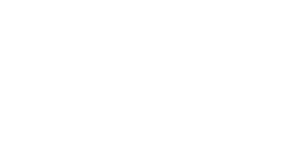

In [5]:
%matplotlib notebook
vis = visualize_.Visualize()
vis.data(X, labelsMat[:,0], cmap='hsv', figsize=(4,4))

# Set source and destination nodes

In [6]:
source = 0
dest1 = 1597
dest2 = 1561

<IPython.core.display.Javascript object>


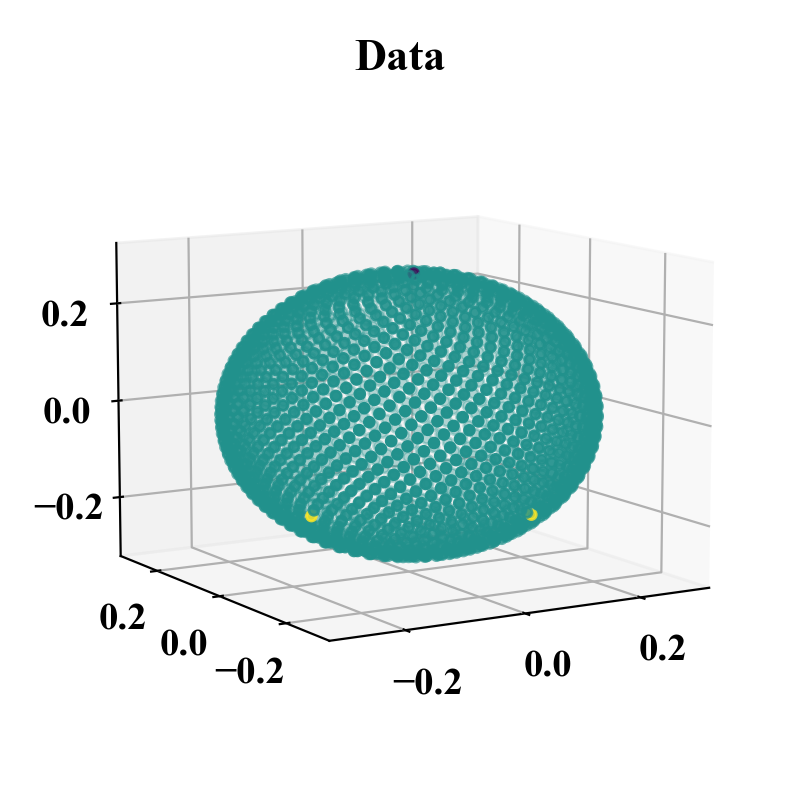

In [7]:
%matplotlib notebook
vis = visualize_.Visualize()
labels = np.zeros(X.shape[0])
labels[source] = -1
labels[dest1] = 1
labels[dest2] = 1
vis.data(X, labels, cmap='viridis', figsize=(4,4), s=50, elev=10, azim=-121)

#  Build connection graph

In [10]:
eps_pca = 0.05
eps = eps_pca
d = 2
CG = cnx.cnxFromData(X, eps_pca, eps, d=d, tol=0.2, kernel='linear', triv_sigma=False)

Total edges before removal: 15550


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [00:00<00:00, 2207.07it/s]


Proportion of edges which were removed due to remoteness:  0.003472668810289389


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [01:33<00:00, 21.44it/s]


# Set B, w, mu, nu, c

In [11]:
n = CG.number_of_nodes()

B = CG.B.T.astype('float32')
w = np.array(list(nx.get_edge_attributes(CG, 'weight').values()))

mu = np.zeros((n * d, 1))
nu = np.zeros((n * d, 1))
mu[source * d: (source + 1) * d, :] = 1
nu[dest1 * d, :] = 1
nu[dest2 * d+1, :] = 1

c = (mu - nu)

# Plot c

<IPython.core.display.Javascript object>


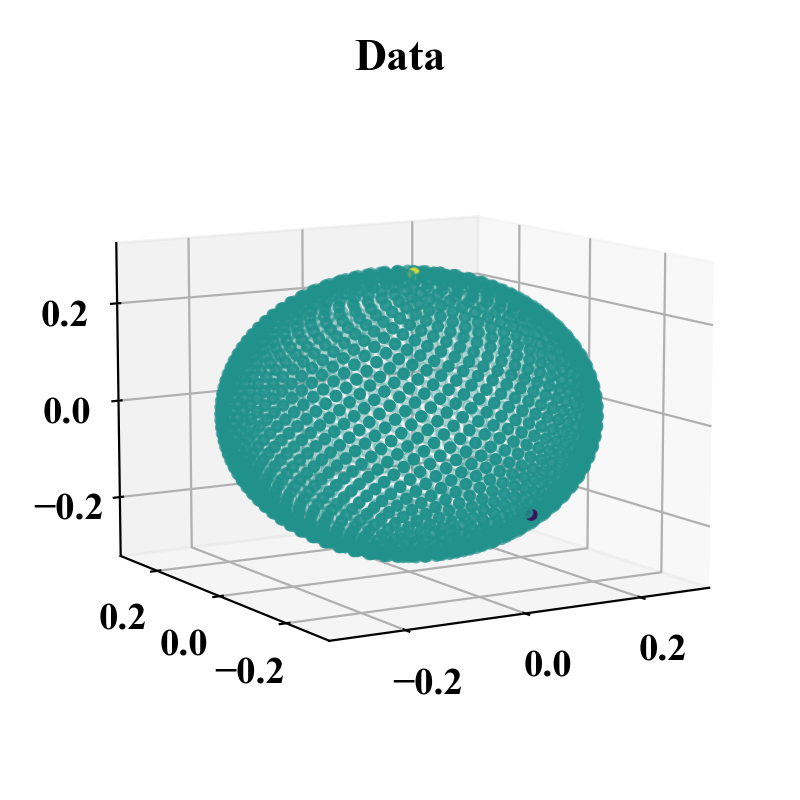

<IPython.core.display.Javascript object>


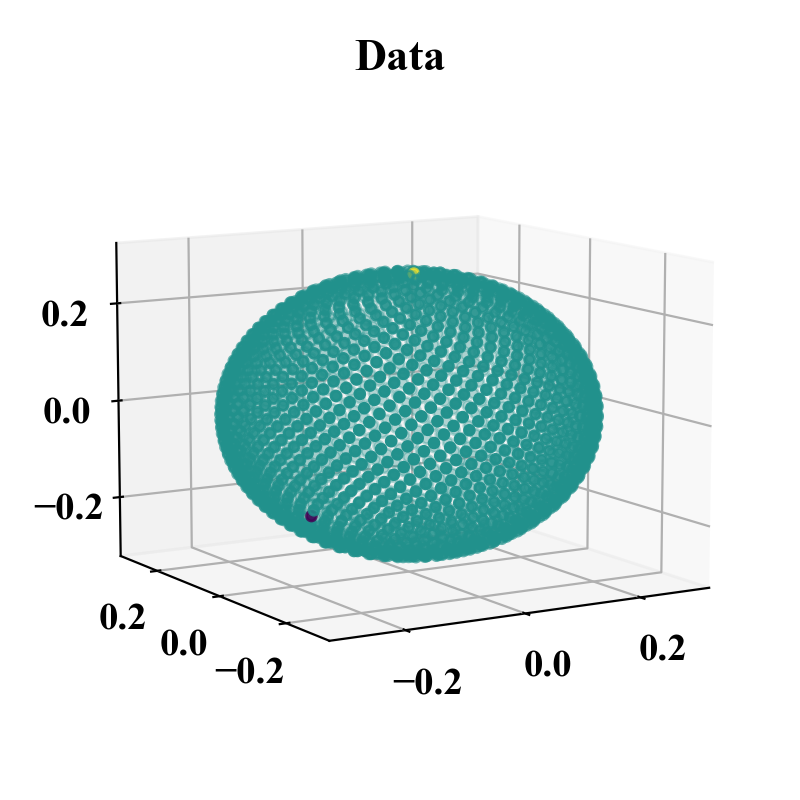

In [12]:
%matplotlib notebook
vis = visualize_.Visualize()
vis.data(X, c.reshape((n,d))[:,0], cmap='viridis', figsize=(4,4), s=50, elev=10, azim=-121)
vis.data(X, c.reshape((n,d))[:,1], cmap='viridis', figsize=(4,4), s=50, elev=10, azim=-121)

# Check feasibility of primal i.e. $B^TJ = c$

In [13]:
temp_J, residuals, _, _ = np.linalg.lstsq(B.T.toarray(), c, rcond=None)
print('Error is:', np.linalg.norm(c.flatten() - B.T.dot(temp_J).flatten())) # if this is small then feasible

Error is: 1.3679751353455274e-14


In [42]:
np.max(w)

0.04999941329736893

# Solve Beckmann dual using gradient descent

In [57]:
learning_rate = 0.01
alpha = np.max(w)*50
n_epochs = 5000

phi, phi0 = cnx.optimize_(B, w, c, learning_rate=learning_rate, alpha=alpha,
                    n_epochs=n_epochs, phi0='least_squares')

Initial loss: (tensor(-10.2127), tensor(6.4765))
epoch: 0, loss: -8.917398, loss0: -10.212710, loss1: 6.476483
epoch: 10, loss: -9.304662, loss0: -10.612763, loss1: 6.540432
epoch: 20, loss: -9.670460, loss0: -11.012997, loss1: 6.712605
epoch: 30, loss: -10.019018, loss0: -11.413244, loss1: 6.971046
epoch: 40, loss: -10.351173, loss0: -11.813092, loss1: 7.309507
epoch: 50, loss: -10.668430, loss0: -12.211964, loss1: 7.717576
epoch: 60, loss: -10.971782, loss0: -12.609203, loss1: 8.187011
epoch: 70, loss: -11.261849, loss0: -13.004169, loss1: 8.711498
epoch: 80, loss: -11.539103, loss0: -13.396292, loss1: 9.285837
epoch: 90, loss: -11.804237, loss0: -13.785103, loss1: 9.904209
epoch: 100, loss: -12.058011, loss0: -14.170218, loss1: 10.560915
epoch: 110, loss: -12.301108, loss0: -14.551321, loss1: 11.250933
epoch: 120, loss: -12.534113, loss0: -14.928143, loss1: 11.970011
epoch: 130, loss: -12.757572, loss0: -15.300459, loss1: 12.714283
epoch: 140, loss: -12.971968, loss0: -15.668081, lo

epoch: 1240, loss: -17.209921, loss0: -30.340776, loss1: 65.653511
epoch: 1250, loss: -17.209961, loss0: -30.348053, loss1: 65.689697
epoch: 1260, loss: -17.209991, loss0: -30.354897, loss1: 65.723763
epoch: 1270, loss: -17.210007, loss0: -30.361330, loss1: 65.755844
epoch: 1280, loss: -17.210018, loss0: -30.367374, loss1: 65.786011
epoch: 1290, loss: -17.210051, loss0: -30.373051, loss1: 65.814232
epoch: 1300, loss: -17.210077, loss0: -30.378374, loss1: 65.840714
epoch: 1310, loss: -17.210087, loss0: -30.383371, loss1: 65.865654
epoch: 1320, loss: -17.210102, loss0: -30.388060, loss1: 65.889023
epoch: 1330, loss: -17.210121, loss0: -30.392454, loss1: 65.910889
epoch: 1340, loss: -17.210136, loss0: -30.396564, loss1: 65.931374
epoch: 1350, loss: -17.210144, loss0: -30.400414, loss1: 65.950577
epoch: 1360, loss: -17.210148, loss0: -30.404015, loss1: 65.968559
epoch: 1370, loss: -17.210140, loss0: -30.407383, loss1: 65.985435
epoch: 1380, loss: -17.210157, loss0: -30.410530, loss1: 66.00

epoch: 2480, loss: -17.210194, loss0: -30.450998, loss1: 66.203247
epoch: 2490, loss: -17.210194, loss0: -30.450998, loss1: 66.203255
epoch: 2500, loss: -17.210201, loss0: -30.450998, loss1: 66.203217
epoch: 2510, loss: -17.210203, loss0: -30.450998, loss1: 66.203201
epoch: 2520, loss: -17.210196, loss0: -30.450998, loss1: 66.203239
epoch: 2530, loss: -17.210196, loss0: -30.451000, loss1: 66.203247
epoch: 2540, loss: -17.210190, loss0: -30.451000, loss1: 66.203278
epoch: 2550, loss: -17.210196, loss0: -30.451000, loss1: 66.203247
epoch: 2560, loss: -17.210182, loss0: -30.451000, loss1: 66.203308
epoch: 2570, loss: -17.210196, loss0: -30.451000, loss1: 66.203247
epoch: 2580, loss: -17.210201, loss0: -30.451000, loss1: 66.203217
epoch: 2590, loss: -17.210201, loss0: -30.451000, loss1: 66.203224
epoch: 2600, loss: -17.210188, loss0: -30.451000, loss1: 66.203285
epoch: 2610, loss: -17.210190, loss0: -30.451000, loss1: 66.203278
epoch: 2620, loss: -17.210197, loss0: -30.451000, loss1: 66.20

epoch: 3720, loss: -17.210197, loss0: -30.451052, loss1: 66.203491
epoch: 3730, loss: -17.210190, loss0: -30.451054, loss1: 66.203537
epoch: 3740, loss: -17.210182, loss0: -30.451054, loss1: 66.203583
epoch: 3750, loss: -17.210201, loss0: -30.451054, loss1: 66.203491
epoch: 3760, loss: -17.210194, loss0: -30.451054, loss1: 66.203522
epoch: 3770, loss: -17.210201, loss0: -30.451054, loss1: 66.203491
epoch: 3780, loss: -17.210205, loss0: -30.451054, loss1: 66.203468
epoch: 3790, loss: -17.210201, loss0: -30.451054, loss1: 66.203491
epoch: 3800, loss: -17.210186, loss0: -30.451054, loss1: 66.203568
epoch: 3810, loss: -17.210194, loss0: -30.451054, loss1: 66.203529
epoch: 3820, loss: -17.210190, loss0: -30.451054, loss1: 66.203545
epoch: 3830, loss: -17.210194, loss0: -30.451057, loss1: 66.203537
epoch: 3840, loss: -17.210197, loss0: -30.451057, loss1: 66.203529
epoch: 3850, loss: -17.210182, loss0: -30.451059, loss1: 66.203613
epoch: 3860, loss: -17.210197, loss0: -30.451061, loss1: 66.20

epoch: 4960, loss: -17.210184, loss0: -30.451080, loss1: 66.203705
epoch: 4970, loss: -17.210194, loss0: -30.451080, loss1: 66.203659
epoch: 4980, loss: -17.210190, loss0: -30.451080, loss1: 66.203674
epoch: 4990, loss: -17.210197, loss0: -30.451080, loss1: 66.203644


# Compute activeness of edges and optimal primal

In [58]:
edge_score = cnx.activenes_of_edges(phi, B, w, c)
J_opt = cnx.optimal_primal(phi, B, w, c, alpha, d) # the mean abs error should be small

mean abs err of sum_{v in V} ||(B^TJ-c)(v)||_1 0.0020307585585411666


In [59]:
J_opt_norm = np.linalg.norm(J_opt, axis=1)

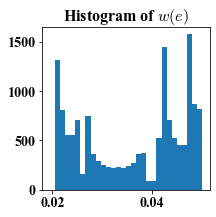

In [60]:
%matplotlib inline
plt.figure(figsize=(3,3))
plt.hist(list(nx.get_edge_attributes(CG, "weight").values()), bins=30)
plt.title('Histogram of $w(e)$')
plt.show()

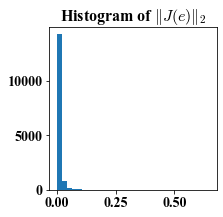

In [61]:
%matplotlib inline
plt.figure(figsize=(3,3))
plt.hist(J_opt_norm, bins=30)
plt.title('Histogram of $\\left\\|J(e)\\right\\|_2$')
plt.show()

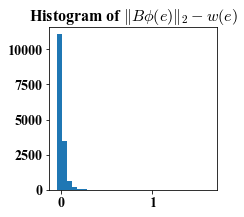

In [62]:
%matplotlib inline
plt.figure(figsize=(3,3))
plt.hist(edge_score, bins=30)
plt.title('Histogram of $\\left\\|B\\phi(e)\\right\\|_2-w(e)$')
plt.show()

# Plot optimal flow

In [63]:
from sklearn.manifold import LocallyLinearEmbedding, Isomap

to_embed = None # no need to embed if the data is already in <= 3 dimensions, else use isomap/ltsa
embed_dim = None
if to_embed is not None:
    if to_embed == 'isomap':
        fit_obj = Isomap(n_components=embed_dim, n_neighbors=10)
    else:
        fit_obj = LocallyLinearEmbedding(n_components=embed_dim, n_neighbors=10, method='ltsa')
    embedding = fit_obj.fit_transform(X)
else:
    embedding = X

In [64]:
J = J_opt

<IPython.core.display.Javascript object>


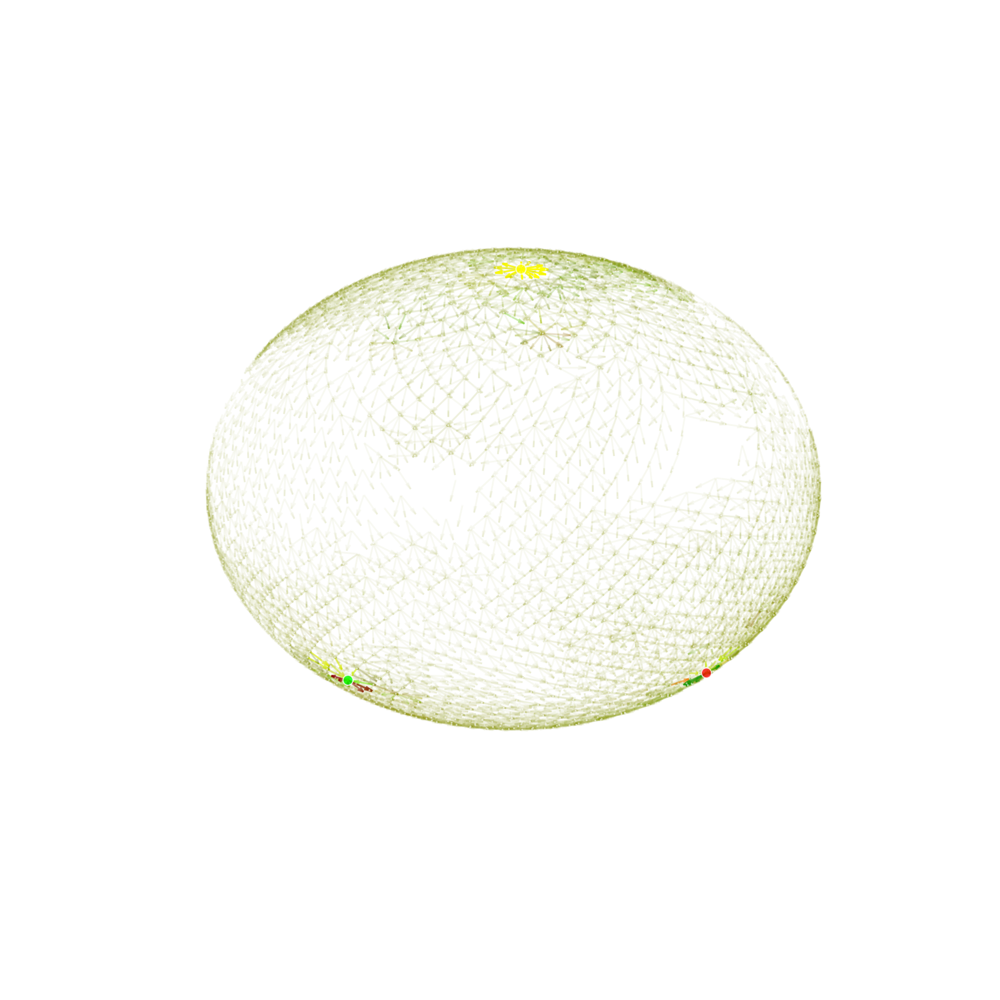

/tmp/ipykernel_24868/3978668627.py:26: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(left=0, right=1, bottom=0, top=1)


In [65]:
%matplotlib notebook

node_size = np.ones(n)*1
node_size[source] = 300
node_size[dest1] = 300
node_size[dest2] = 300

node_color = np.zeros((n,4))
node_color[:,:3] = 1
node_color[source,:] = [1,1,0,1]
node_color[dest1] = [1,0,0,1]
node_color[dest2] = [0,1,0,1]

mask = (edge_score > 0)
J_ = J[mask,:]

edge_color = np.zeros((J.shape[0],4))
edge_color[mask,0] = cm.Greys((J_[:,0]-np.min(J_[:,0]))/np.ptp(J_[:,0]))[:,0]
edge_color[mask,1] = cm.Greys((J_[:,1]-np.min(J_[:,1]))/np.ptp(J_[:,1]))[:,1]
edge_color[mask,-1] = 0.05 + 0.95*(edge_score[mask]-np.min(edge_score[mask]))/np.ptp(edge_score[mask])

draw3d(CG, embedding, node_color, node_size, edge_color, edge_width=0.025, figsize=(12, 12))
plt.gca().view_init(elev=20, azim=-119)
plt.show()

<IPython.core.display.Javascript object>


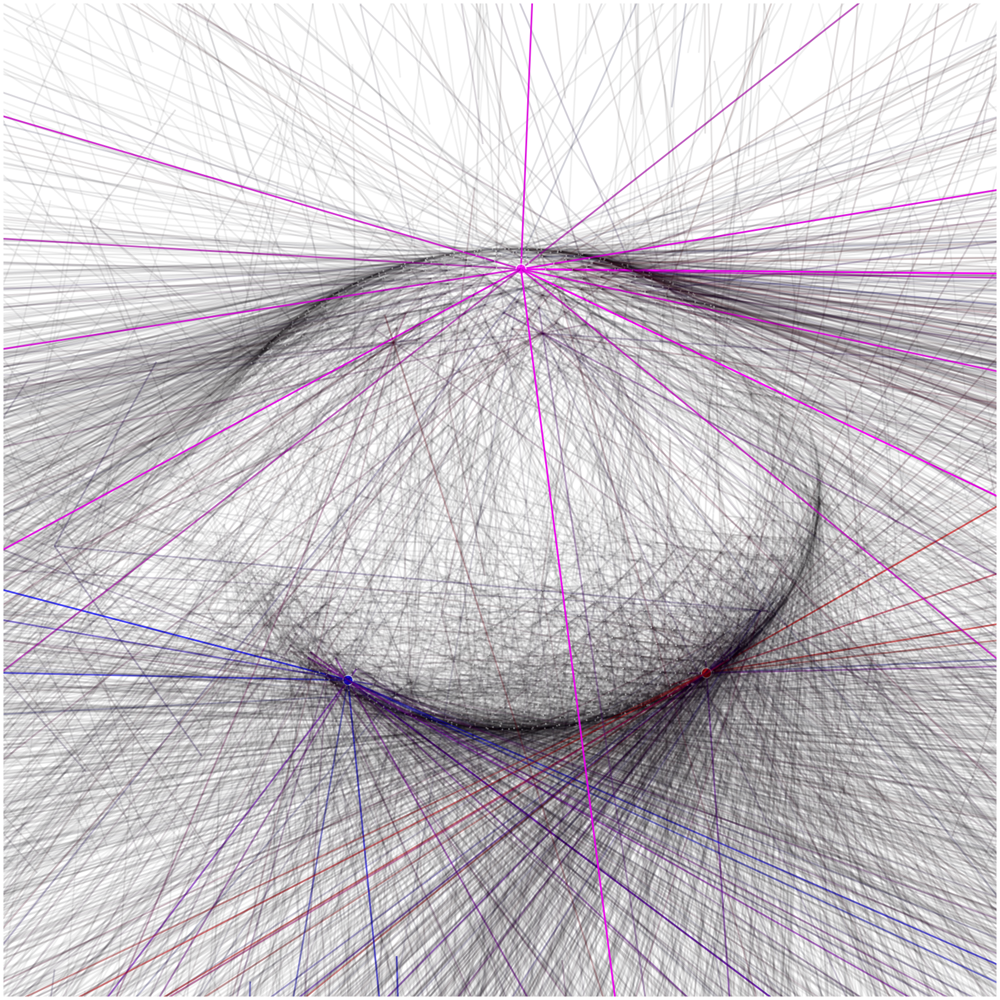

/tmp/ipykernel_24868/3978668627.py:26: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(left=0, right=1, bottom=0, top=1)


In [52]:
%matplotlib notebook
node_size = np.ones(n)*1
node_size[source] = 300
node_size[dest1] = 300
node_size[dest2] = 300

node_color = np.zeros((n,4))
node_color[:,:3] = 1
node_color[source,:] = [1,0,1,1]
node_color[dest1] = [1,0,0,1]
node_color[dest2] = [0,0,1,1]

mask = (edge_score > 0)
J_ = J[mask,:]
mJ_ = np.max(np.abs(J_))

edge_color = np.zeros((J.shape[0],4))
edge_color[mask,0] = np.abs(J_[:,0])/mJ_
edge_color[mask,2] = np.abs(J_[:,1])/mJ_
edge_color[mask,-1] = 0.05 + 0.95*(edge_score[mask]-np.min(edge_score[mask]))/np.ptp(edge_score[mask])

draw3d(CG, embedding, node_color, node_size, edge_color, edge_width=5, figsize=(12, 12))
plt.gca().view_init(elev=20, azim=-119)
plt.show()

# Plot optimal phi

In [53]:
node_color_ = phi.reshape((CG.number_of_nodes(), d))

<IPython.core.display.Javascript object>


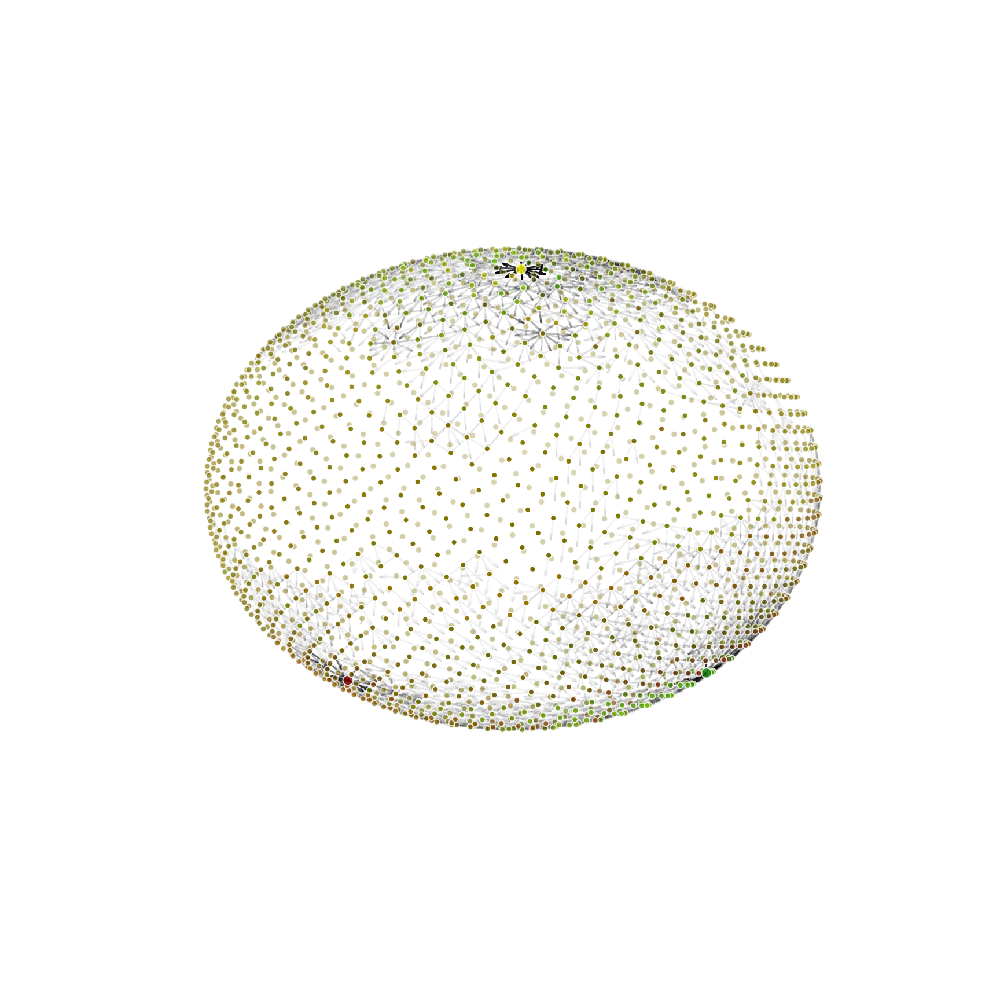

/tmp/ipykernel_24868/3978668627.py:26: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(left=0, right=1, bottom=0, top=1)


In [56]:
%matplotlib notebook
node_size = np.ones(n)*100
node_size[source] = 300
node_size[dest1] = 300
node_size[dest2] = 300

node_color = np.zeros((n,4))
node_color[:,-1] = 1
node_color[:,0] = (node_color_[:,0] - np.min(node_color_[:,0]))/np.ptp(node_color_[:,0])
node_color[:,1] = (node_color_[:,1] - np.min(node_color_[:,1]))/np.ptp(node_color_[:,1])

mask = (edge_score > 0)

edge_color = np.zeros((edge_score.shape[0],4))
edge_color[mask,-1] = 0.05 + 0.95*(edge_score[mask]-np.min(edge_score[mask]))/np.ptp(edge_score[mask])

draw3d(CG, embedding, node_color, node_size, edge_color, edge_width=0.025, figsize=(12, 12))
plt.gca().view_init(elev=20, azim=-119)
plt.show()